## Numerical Optimization
We have seen some strategies to find a solution to optimization objectives by means of solving a system of equations. These strategies work usually fine for simple objectives, but if I have a lot of valleys and hills in my optimization objective, then solving this system of equations analytically will not always be possible. What can we do then?       

If the minimizers can not be computed directly/analytically, then numerical optimization can come to the rescue. The idea is that I start somewhere in my hilly landscape and then try to walk to a valley with a specified strategy. For those types of methods it's good to know how good the strategy is. Important is for example to ask whether I will ever arrive at my minimum if I just walk long enough, or if I have to wonder endlessly around in a bad case. And what happens if I just walk a few steps, would I then have improved upon my starting position or might I not have descended at all? We state here two very popular numerical optimization methods: coordinate descent and gradient descent. Both are presented for the optimization of an unconstrained objective, but they do have extensions to incorporate constraints as well. This is beyond of the scope of this course, though.  
The general scheme of numerical optimization methods is typically 

```{prf:algorithm} Numerical Optimization

**Input**: the function $f$ to minimize, the maximum number of steps $t_{max}$ 
1. $\vvec{x}_0\gets$ `Initialize`($\vvec{x}_0$)  
2. **for** $t\in\{1,\ldots,t_{max}-1\}$
    1. $\vvec{x}_{t+1}\gets $`Update`($\vvec{x}_t,f$)
3. **return** $\vvec{x}_{t_{max}}$
```

### Coordinate descent
The coordinate descent method is promising if we can not determine the minimum to the function analytically, but the minimum in a coordinate direction. The update is performed by cycling over all coordinates and walking to the minimum subject to that coordinate in each step.

```{prf:algorithm} Coordinate Descent
**Input**: the function $f$ to minimize 
1. $\vvec{x}_0\gets$ `Initialize`($\vvec{x}_0$)  
2. **for** $t\in\{1,\ldots,t_{max}-1\}$
    1. **for** $i\in\{1,\ldots d\}$ do
        1. $\displaystyle {x_i}^{(t+1)}\leftarrow \argmin_{x_i} f({x_1}^{(t+1)},\ldots ,{x_{i-1}}^{(t+1)}, x_i,{x_{i+1}}^{(t)},\ldots ,{x_d}^{(t)})$
3. **return** $\vvec{x}_{t_{max}}$
```
The figure below shows the level set of a function, where every ring indicates the points in the domain of the function that have a specified function value $\{\vvec{x}\mid f(\vvec{x})=c\}$. The plotted function has a minimum at the center of the ellipses. We start at $\vvec{x}_0$ and then move to the minimum in direction of the vertical coordinate. That is, we move to the smallest ellipse (smallest diameter) we can touch in direction of the vertical coordinate. Then we move to the minimum in direction of the horizontal coordinate and we are already at our minimum where the method stops.
```{tikz}
\begin{tikzpicture}[samples=200,smooth]
        \begin{scope}
            \clip(-4,-1) rectangle (4,4);
            \draw plot[domain=0:360] ({cos(\x)*sqrt(20/(sin(2*\x)+2))},{sin(\x)*sqrt(20/(sin(2*\x)+2))});
            \draw plot[domain=0:360] ({cos(\x)*sqrt(16/(sin(2*\x)+2))},{sin(\x)*sqrt(16/(sin(2*\x)+2))});
            \draw plot[domain=0:360] ({cos(\x)*sqrt(12/(sin(2*\x)+2))},{sin(\x)*sqrt(12/(sin(2*\x)+2))});
            \draw plot[domain=0:360] ({cos(\x)*sqrt(8/(sin(2*\x)+2))},{sin(\x)*sqrt(8/(sin(2*\x)+2))});
            \draw plot[domain=0:360] ({cos(\x)*sqrt(4/(sin(2*\x)+2))},{sin(\x)*sqrt(4/(sin(2*\x)+2))});
            \draw plot[domain=0:360] ({cos(\x)*sqrt(1/(sin(2*\x)+2))},{sin(\x)*sqrt(1/(sin(2*\x)+2))});
            \draw plot[domain=0:360] ({cos(\x)*sqrt(0.0625/(sin(2*\x)+2))},{sin(\x)*sqrt(0.0625/(sin(2*\x)+2))});

            \draw[->,blue,ultra thick] (-2,3.65) to (-2,0);
            \draw[->,blue,ultra thick] (-2,0) to (0,0);
            
            \node at (-2.9,3.5){ $(x_1^{(0)},x_2^{(0)})$};
            \node at (-2.9,0.4){ $(x_1^{(1)},x_2^{(0)})$};
            \node at (0,0.5){$(x^{(1)}_1,x^{(1)}_1)$};
        \end{scope}
    \end{tikzpicture}
```
Coordinate descent minimizes the function value in every step:
$$ f(\vvec{x}^{(0)})\geq f(\vvec{x}^{(1)})\geq f(\vvec{x}^{(2)})\geq\ldots$$

#### Example: Rosenbrock function
Let's try to apply coordinate descent to find the minimum of the Rosenbrock function. From {prf:ref}`expl_fonc` we know the partial derivatives of the function 
\begin{align*}
    f(\vvec{x})&= 100(x_2-x_1^2)^2 +(1-x_1)^2.\\
    \frac{\partial}{\partial x_1}f(\vvec{x})&= 400x_1(x_1^2-x_2) +2(x_1-1)\\
    \frac{\partial}{\partial x_2}f(\vvec{x})&= 200(x_2-x_1^2).
\end{align*}
We compute the minima of the function in direction of the coordinates as would normally compute the minima of a polynomial: set the derivative to zero. Unfortunately, this doesn't work well for the partial derivative subject to $x_1$. Using symbolic solvers like `sympy` give three roots of the partial derivative, of which two are complex numbers. The one real-valued root is only defined for $x_1$ no larger than a constant that is close to zero. Hence, this example doesn't work well for coordinate descent, we exemplify the trajectory nevertheless until the roots are not defined anymore. The minimizer of the function subject to coordinate $x_2$ is easily computed by setting the partial derivative to zero: 
\begin{align*}
      \frac{\partial}{\partial x_2}f(\vvec{x})&=200(x_2-x_1^2)=0
      &\Leftrightarrow x_2 =x_1^2
\end{align*}
Hence, we have update rules: 
\begin{align*}
    \argmin_{x_1\in\mathbb{R}} f(x_1,x_2) &=\text{magic from sympy} \\
    \argmin_{x_2\in\mathbb{R}} f(x_1,x_2) &=x_1^2
\end{align*}
The figure below shows the result of these update rules when starting at $(-1.5,-1)$. We see that in the beginning we make big steps towards the minimizer (1,1), but then those steps get smaller and smaller once we are in the valley. 

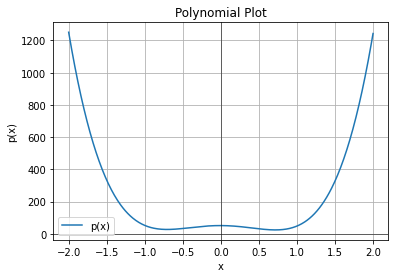

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Define the polynomial coefficients (highest degree first)
x_2=0.5
coeffs = [100, 0, -(200*x_2+1), -2, 1+100*x_2]  # x^4 - 3x^3 + 2x^2 + 1

# Define the polynomial function
p = np.poly1d(coeffs)

# Create x values
x = np.linspace(-2, 2, 500)

# Evaluate the polynomial
y = p(x)

# Plot
plt.plot(x, y, label='p(x)')
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.title('Polynomial Plot')
plt.xlabel('x')
plt.ylabel('p(x)')
plt.grid(True)
plt.legend()
plt.show()


In [2]:
from sympy import symbols, solve, Eq

# Define symbolic variables
x, c = symbols('x c')

# Define the polynomial
poly = 200*x**3 + x*(-200*c+1) -1

# Solve for x
roots = solve(poly, x)

print("Roots:")
for r in roots:
    print(r)


Roots:
-(1/600 - c/3)/(sqrt((1/600 - c/3)**3 + 1/160000) + 1/400)**(1/3) + (sqrt((1/600 - c/3)**3 + 1/160000) + 1/400)**(1/3)
-(1/600 - c/3)/((-1/2 - sqrt(3)*I/2)*(sqrt((1/600 - c/3)**3 + 1/160000) + 1/400)**(1/3)) + (-1/2 - sqrt(3)*I/2)*(sqrt((1/600 - c/3)**3 + 1/160000) + 1/400)**(1/3)
-(1/600 - c/3)/((-1/2 + sqrt(3)*I/2)*(sqrt((1/600 - c/3)**3 + 1/160000) + 1/400)**(1/3)) + (-1/2 + sqrt(3)*I/2)*(sqrt((1/600 - c/3)**3 + 1/160000) + 1/400)**(1/3)


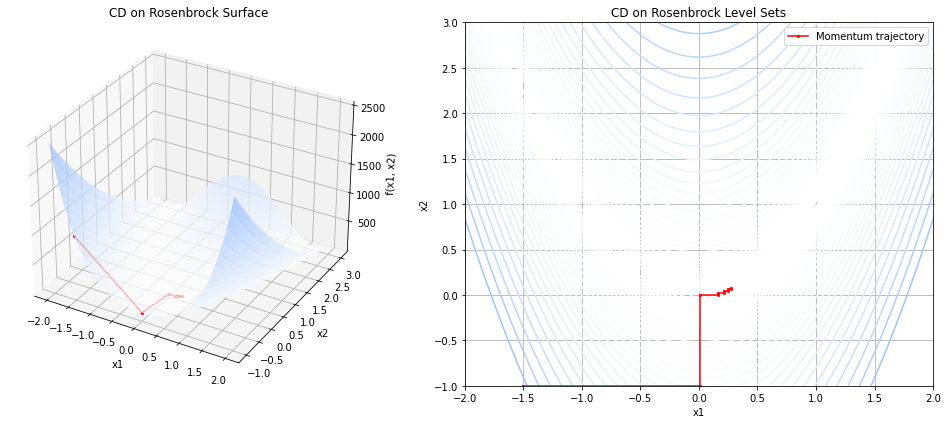

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# Rosenbrock function and gradient
def rosenbrock(theta):
    x, y = theta
    return (1 - x)**2 + 100 * (y - x**2)**2

#def rosenbrock_grad(theta):
#    x, y = theta
#    dx = -2 * (1 - x) - 400 * x * (y - x**2)
#    dy = 200 * (y - x**2)
#    return np.array([dx, dy])

# gradient descent
def cd(init_theta, steps=10):
    theta = np.array(init_theta, dtype=float)
    trajectory = [theta.copy()]
    i = 0
    
    for _ in range(steps):
        if i==0:
            #theta[0]=-(1/600 - theta[1]/3)/((-1/2 - complex(0,np.sqrt(3))/2)*(np.sqrt((1/600 - theta[1]/3)**3 + 1/160000) + 1/400)**(1/3)) + (-1/2 - complex(0,np.sqrt(3))/2)*(np.sqrt((1/600 - theta[1]/3)**3 + 1/160000) + 1/400)**(1/3)
            #theta[0]=-(1/600 - theta[1]/3)/((-1/2 - np.sqrt(3)/2)*(np.sqrt((1/600 - theta[1]/3)**3 + 1/160000) + 1/400)**(1/3)) + (-1/2 - np.sqrt(3)/2)*(np.sqrt((1/600 - theta[1]/3)**3 + 1/160000) + 1/400)**(1/3)
            theta[0]=-(1/600 - theta[1]/3)/(np.sqrt((1/600 - theta[1]/3)**3 + 1/160000) + 1/400)**(1/3) + (np.sqrt((1/600 - theta[1]/3)**3 + 1/160000) + 1/400)**(1/3)
        else:
            theta[1]=theta[0]**2
        trajectory.append(theta.copy())
        i= (i+1)%2
    
    return np.array(trajectory)

# Compute trajectory
trajectory = cd(init_theta=[-1.5, -1])

# Prepare grid
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = (1 - X)**2 + 100 * (Y - X**2)**2

# Compute Z values along trajectory
Z_traj = np.array([rosenbrock(p) for p in trajectory])

# Plotting
fig = plt.figure(figsize=(14, 6))
cm_0 = LinearSegmentedColormap.from_list("mycmap", ["#ffffff","#a0c3ff"])
# 3D surface with trajectory
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(X, Y, Z, cmap=cm_0, alpha=0.8, edgecolor='none')
ax1.plot(trajectory[:, 0], trajectory[:, 1], Z_traj, color='red', marker='o', markersize=2, label='Momentum trajectory')
ax1.set_title("CD on Rosenbrock Surface")
ax1.set_xlabel("x1"); ax1.set_ylabel("x2"); ax1.set_zlabel("f(x1, x2)")

# Contour plot (level sets)
ax2 = fig.add_subplot(1, 2, 2)
ax2.contour(X, Y, Z, levels=np.logspace(-1, 3, 50), cmap=cm_0)
ax2.plot(trajectory[:, 0], trajectory[:, 1], marker='o', markersize=2, color='red', label='Momentum trajectory')
ax2.set_title(f"CD on Rosenbrock Level Sets")
ax2.set_xlabel("x1"); ax2.set_ylabel("x2")
ax2.grid(True); ax2.legend()

plt.tight_layout()
plt.show()


### Gradient Descent
If we can't solve the system of equations given by FONC, also no coordinate-wise, but the function is differentiable, then we can apply gradient descent. Gradient descent is a strategy according to which you take a step in the direction which goes down the most steeply from where you stand.

```{prf:definition}
The directional derivative of a real-valued function $f:\mathbb{R}^d\rightarrow \mathbb{R}$ along the direction given by the vector $\vvec{v}\in\mathbb{R}$ is the function 
$$\lim_{h\rightarrow 0}\frac{f(\vvec{x}+h\vvec{v})-f(\vvec{x})}{h\lVert\vvec{v}\rVert}.$$
```
The directional derivative generalizes the concept of a derivative from one dimension to multiple ones. The plot below shows a 3D function and a direction vector $\vvec{v}$ (red) at point $\vvec{x}_0=(1,1)$. The directional derivative is then the tangent at point $\vvec{x}_0$ in the direction of $\vvec{v}$ (plotted on the left).

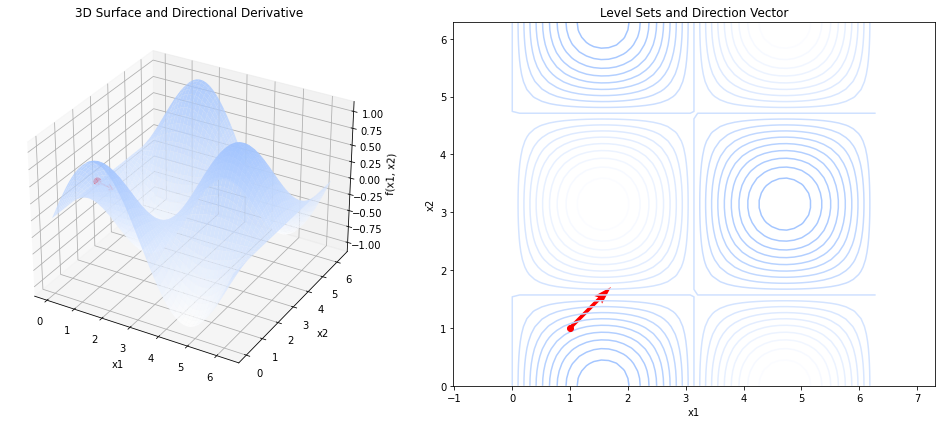

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# Define the function f(x, y)
def f(x, y):
    return np.sin(x) * np.cos(y)

# Define the point and the direction for directional derivative
x0, y0 = 1.0, 1.0  # base point


# Create a grid for plotting
x = np.linspace(0, 2*np.pi, 50)
y = np.linspace(0, 2*np.pi, 50)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# Compute the gradient at (x0, y0) 
dfdx = np.cos(x0)*np.cos(y0) 
dfdy = -np.sin(x0)*np.sin(y0)
grad_f = np.array([dfdx, dfdy])

angle=0.25*np.pi
v = np.array([np.cos(angle), np.sin(angle)])  # direction vector
    
# Directional derivative
dir_derivative = np.dot(grad_f, v)

# Set up the figure
fig = plt.figure(figsize=(14, 6))
cm_0 = LinearSegmentedColormap.from_list("mycmap", ["#ffffff","#a0c3ff"])

# 3D plot of the surface and direction
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(X, Y, Z, cmap=cm_0, alpha=0.8)
ax1.scatter(x0, y0, f(x0, y0), color='red', s=50)
ax1.quiver(x0, y0, f(x0, y0), v[0], v[1], dir_derivative, color='red', length=0.5)
ax1.set_title('3D Surface and Directional Derivative')
ax1.set_xlabel("x1"); ax1.set_ylabel("x2"); ax1.set_zlabel("f(x1, x2)")

# 2D plot of level sets and direction
ax2 = fig.add_subplot(122)
CS = ax2.contour(X, Y, Z, levels=20, cmap=cm_0)
ax2.plot(x0, y0, 'ro')  # mark the base point
ax2.quiver(x0, y0, v[0], v[1], angles='xy', scale_units='xy', scale=1, color='red')
ax2.set_title('Level Sets and Direction Vector')
ax2.set_xlabel('x1')
ax2.set_ylabel('x2')
ax2.axis('equal')

plt.tight_layout()
plt.show()


We can also visualize the directional derivative as the slope of the tangent at point $\vvec{x}_0$ when we project the graph of the 3D function on the direction given by $\vvec{v}$. The red vector on the right plot indicates the direction $\vvec{v}$ and the slope of the orange tangent on the left is the directional derivative in the direction of $\vvec{v}$.

In [5]:
from JSAnimation import IPython_display
from matplotlib import animation
from IPython.display import HTML
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
def animatedirectDeriv(i,ax1,ax2):
    ax1.cla()#clear axes
    ax2.cla()#clear axes
    global Z,X,Y
    angle = i/50*np.pi
    v = np.array([np.cos(angle), np.sin(angle)])  # direction vector
    # Directional derivative
    dir_derivative = np.dot(grad_f, v)
    
    # 3D plot of the surface and direction
    a = np.linspace(-1, 2, 50)
    ax1.plot(a, f(x0+a*v[0],y0+a*v[1]))
    a = np.linspace(-0.5, 0.5, 50)
    ax1.plot(a,dir_derivative*a + f(x0,y0))
    ax1.set_title('2D Projection onto direction')
    ax1.set_xlabel('a')
    ax1.set_ylabel('f(x0+av)')

    # 2D plot of level sets and direction
    CS = ax2.contour(X, Y, Z, levels=20, cmap=cm_0)
    ax2.plot(x0, y0, 'ro')  # mark the base point
    ax2.quiver(x0, y0, v[0], v[1], angles='xy', scale_units='xy', scale=1, color='red')
    ax2.set_title('Level Sets and Direction Vector')
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.axis('equal')
    
    return

cm_0 = LinearSegmentedColormap.from_list("mycmap", ["#ffffff","#a0c3ff"])
# Define the function f(x, y)
def f(x, y):
    return np.sin(x) * np.cos(y)

# Create a grid for plotting
x = np.linspace(0, 2*np.pi, 50)
y = np.linspace(0, 2*np.pi, 50)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# Compute the gradient at (x0, y0) 
dfdx = np.cos(x0)*np.cos(y0) 
dfdy = -np.sin(x0)*np.sin(y0)
grad_f = np.array([dfdx, dfdy])

fig = plt.figure(figsize=(14, 6))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
anim = animation.FuncAnimation(fig, animatedirectDeriv, fargs=(ax1, ax2),frames=100, interval=200, blit=False)
plt.close()
HTML(anim.to_jshtml())

Also in multiple dimensions, the derivative is a linear function. In fact, it can be computed by the inner product of the direction vector and the gradient.
```{prf:theorem}
Given a real-valued function $f:\mathbb{R}^d\rightarrow \mathbb{R}$ whose partial derivatives exist and are continuous. The directional derivative in the direction of vector $\vvec{v}$ can be computed as the dot product with the gradient:
$$\lim_{h\rightarrow 0}\frac{f(\vvec{x}+h\vvec{v})-f(\vvec{x})}{h\lVert\vvec{v}\rVert} = \nabla f(\vvec{x})^\top \frac{\vvec{v}}{\lVert\vvec{v}\rVert}$$
```
````{toggle}
```{prf:proof}
We show the result first for $d=2$ dimensions. 
\begin{align*}
\frac{f(\vvec{x}+h\vvec{v})-f(\vvec{x})}{h\lVert\vvec{v}\rVert} &=\frac{f(x_1+hv_1,x_2 +hv_2)-f(x_1+hv_1,x_2)+f(x_1+hv_1,x_2)-f(\vvec{x})}{h\lVert\vvec{v}\rVert}\\
&= \frac{f(x_1+hv_1,x_2 +hv_2)-f(x_1+hv_1,x_2)}{h\lVert\vvec{v}\rVert}+\frac{f(x_1+hv_1,x_2)-f(\vvec{x})}{h\lVert\vvec{v}\rVert}
\end{align*}
The term on the right can be transformed into
\begin{align*}
\frac{f(x_1+hv_1,x_2)-f(\vvec{x})}{h\lVert\vvec{v}\rVert} \frac{v_1}{v_1} & =
\frac{f(x_1+hv_1,x_2)-f(\vvec{x})}{hv_1} \frac{v_1}{\lVert\vvec{v}\rVert} \rightarrow \frac{\partial f(\vvec{x})}{\partial x_1} \frac{v_1}{\lVert\vvec{v}\rVert}
\end{align*}
for $h\rightarrow 0$.
Now, we still need to transform the first part. To do so, we apply the mean value theorem, stating that there exists some $0<t<h$ such that
\begin{align*}
\frac{\partial f(x_1+hv_1,x_2 + tv_2)}{\partial x_2 + tv_2}\frac{v_2}{\lVert\vvec{v}\rVert}=\frac{f(x_1+hv_1,x_2 +hv_2)-f(x_1+hv_1,x_2)}{hv_2} \frac{v_2}{\lVert\vvec{v}\rVert}
\end{align*}
If we now let $h\rightarrow 0$, then we also have $t\rightarrow 0$ and hence $(x_1+hv_1,x_2 + tv_2)\rightarrow (x_1,x_2)$. Since the partial gradients are continuous, we have for $h\rightarrow 0$
$$\frac{\partial f(x_1+hv_1,x_2 + tv_2)}{\partial x_2 + tv_2} \rightarrow \frac{\partial f(x_1,x_2)}{\partial x_2}.$$
As a result we have 
\begin{align*}
\frac{f(\vvec{x}+h\vvec{v})-f(\vvec{x})}{h\lVert\vvec{v}\rVert} &\rightarrow \frac{\partial f(\vvec{x})}{\partial x_2} \frac{v_2}{\lVert\vvec{v}\rVert} + \frac{\partial f(\vvec{x})}{\partial x_1} \frac{v_1}{\lVert\vvec{v}\rVert} = \nabla f(\vvec{x})^\top \frac{\vvec{v}}{\lVert\vvec{v}\rVert}.
\end{align*}
If we have now more than two dimensions, then we can repeat this proof structure and inductively split always one partial gradient from the directional derivative.
```
````
The linearity of the gradient implies now that the gradient points into the direction of steepest ascent.
```{prf:theorem}
The gradient of a real-valued function points into the direction of steepest ascent.
```
```{prf:proof}
We want to find the direction into which the directional derivative increases the most.
\begin{align*} 
\max_{\vvec{v}}\lim_{h\rightarrow 0}\frac{f(\vvec{x}+h\vvec{v})-f(\vvec{x})}{h\lVert\vvec{v}\rVert} &= \max_{\vvec{v}} \nabla f(\vvec{x})^\top \frac{\vvec{v}}{\lVert\vvec{v}\rVert}\\
&= \cos(\sphericalangle (\vvec{v},\nabla f(\vvec{x}))) \lVert \nabla f(\vvec{x})\rVert \left\lVert \frac{\vvec{v}}{\lVert\vvec{v}\rVert}\right\rVert\\
&= \cos(\sphericalangle (\vvec{v},\nabla f(\vvec{x}))) \lVert \nabla f(\vvec{x})\rVert\\
&\leq \lVert \nabla f(\vvec{x})\rVert,
\end{align*}
where the last inequality stems from the fact that the cosine function is at most equal to one and this maximum is attained if $\vvec{v}$ points into the same direction as $\nabla f(\vvec{x})$.
```
From the proof of the theorem above, it also follows that the negative gradient points into the direction of steepest descent. This is because the cosine of the angle between any vector $\vvec{v}$ and $\nabla f(\vvec{x})$ is minimized if we choose $\vvec{v}=-\nabla f(\vvec{x})$.
```{prf:corollary}
The negative gradient of a real-valued function points into the direction of steepest descent.
```
We have a look at the gradient direction in our 3D example.

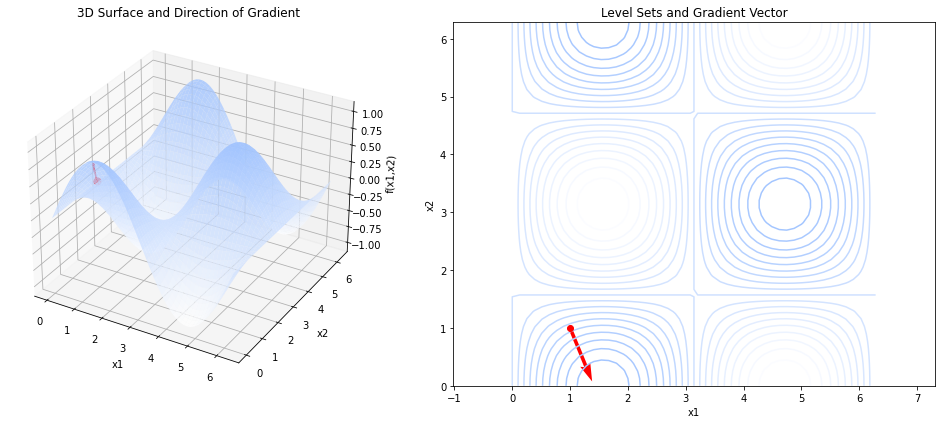

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# Define the function f(x, y)
def f(x, y):
    return np.sin(x) * np.cos(y)

# Define the point and the direction for directional derivative
x0, y0 = 1.0, 1.0  # base point


# Create a grid for plotting
x = np.linspace(0, 2*np.pi, 50)
y = np.linspace(0, 2*np.pi, 50)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# Compute the gradient at (x0, y0) 
dfdx = np.cos(x0)*np.cos(y0) 
dfdy = -np.sin(x0)*np.sin(y0)
grad_f = np.array([dfdx, dfdy])
v = grad_f / np.linalg.norm(grad_f)  # normalize the direction vector
# Directional derivative
dir_derivative = np.dot(grad_f, v)

# Set up the figure
fig = plt.figure(figsize=(14, 6))
cm_0 = LinearSegmentedColormap.from_list("mycmap", ["#ffffff","#a0c3ff"])

# 3D plot of the surface and direction
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(X, Y, Z, cmap=cm_0, alpha=0.8)
ax1.scatter(x0, y0, f(x0, y0), color='red', s=50)
ax1.quiver(x0, y0, f(x0, y0), v[0], v[1], dir_derivative, color='red', length=0.5)
ax1.set_title('3D Surface and Direction of Gradient')
ax1.set_xlabel('x1')
ax1.set_ylabel('x2')
ax1.set_zlabel('f(x1,x2)')

# 2D plot of level sets and direction
ax2 = fig.add_subplot(122)
CS = ax2.contour(X, Y, Z, levels=20, cmap=cm_0)
ax2.plot(x0, y0, 'ro')  # mark the base point
ax2.quiver(x0, y0, v[0], v[1], angles='xy', scale_units='xy', scale=1, color='red')
ax2.set_title('Level Sets and Gradient Vector')
ax2.set_xlabel('x1')
ax2.set_ylabel('x2')
ax2.axis('equal')

plt.tight_layout()
plt.show()


We define now the optimization method of gradient descent: in every iteration we take a step into the direction of steepest descent.
```{prf:algorithm} Gradient Descent
**Input**: the function $f$ to minimize, step-size $\eta$ 
1. $\vvec{x}_0\gets$ `Initialize`($\vvec{x}_0$)  
2. **for** $t\in\{1,\ldots,t_{max}-1\}$
    1. $\vvec{x}_{t+1}\leftarrow \vvec{x}_t - \eta \nabla f(\vvec{x}_t)$
3. **return** $\vvec{x}_{t_{max}}$
```

The parameter $\eta$ doesn't have to be a constant, it might also be a function that returns the *step size* depending on the amount of steps that have already performed. Setting the step size well is often a difficult task. The figure below shows how gradient descent makes the updates based on the local information.

```{tikz}
\begin{tikzpicture}[samples=200,smooth]
\begin{scope}
    \clip(-4,-1) rectangle (4,4);
    \draw plot[domain=0:360] ({cos(\x)*sqrt(20/(sin(2*\x)+2))},{sin(\x)*sqrt(20/(sin(2*\x)+2))});
    \draw plot[domain=0:360] ({cos(\x)*sqrt(16/(sin(2*\x)+2))},{sin(\x)*sqrt(16/(sin(2*\x)+2))});
    \draw plot[domain=0:360] ({cos(\x)*sqrt(12/(sin(2*\x)+2))},{sin(\x)*sqrt(12/(sin(2*\x)+2))});
    \draw plot[domain=0:360] ({cos(\x)*sqrt(8/(sin(2*\x)+2))},{sin(\x)*sqrt(8/(sin(2*\x)+2))});
    \draw plot[domain=0:360] ({cos(\x)*sqrt(4/(sin(2*\x)+2))},{sin(\x)*sqrt(4/(sin(2*\x)+2))});
    \draw plot[domain=0:360] ({cos(\x)*sqrt(1/(sin(2*\x)+2))},{sin(\x)*sqrt(1/(sin(2*\x)+2))});
    \draw plot[domain=0:360] ({cos(\x)*sqrt(0.0625/(sin(2*\x)+2))},{sin(\x)*sqrt(0.0625/(sin(2*\x)+2))});

    \draw[->,blue,ultra thick] (-2,3.65) to (-1.93,3);
    \draw[->,blue,ultra thick] (-1.93,3) to (-1.75,2.4);
    \draw[->,blue,ultra thick] (-1.75,2.4) to (-1.5,1.8);
    \draw[->,blue,ultra thick] (-1.5,1.8) to (-1.15,1.3);      \node at (-1.4,3.8){ $\mathbf{x}_0$};
    \node at (-1.2,3.2){$\mathbf{x}_1$};
    \node at (-1.05,2.6){ $\mathbf{x}_2$};
    \node at (-0.8,2){ $\mathbf{x}_3$};
    \node at (-0.6,1.4){ $\mathbf{x}_4$};
\end{scope}
\end{tikzpicture}
```

Gradient descent decreases the function value in every step if the step size is small enough (because the negative gradient points in the direction of steepest descent)
$$f(\vvec{x}_0)\geq f(\vvec{x}_1)\geq f(\vvec{x}_2)\geq\ldots.$$
However, decreasing the function value in every step is in practice not neccessarily desirable. In particular in the beginning of the optimization, it's useful to take larger steps to survey the landscape before converging to a local minimum.
#### Example: Rosenbrock Function 
We illustrate the effect of the step-size by means of the Rosenbrock function. We start at point $(-1.5,1.5)$ and choose a maximum number of 500 iterations. For our first run, we choose a small step-size $\eta =0.0015$. In the beginning, this step size seems too large, since we can see it zig-zagging, but then it lands in the valley where the gradient norm is small and we make only very tiny steps. In the 500 iterations, we do not reach the minimum at $(1,1)$.

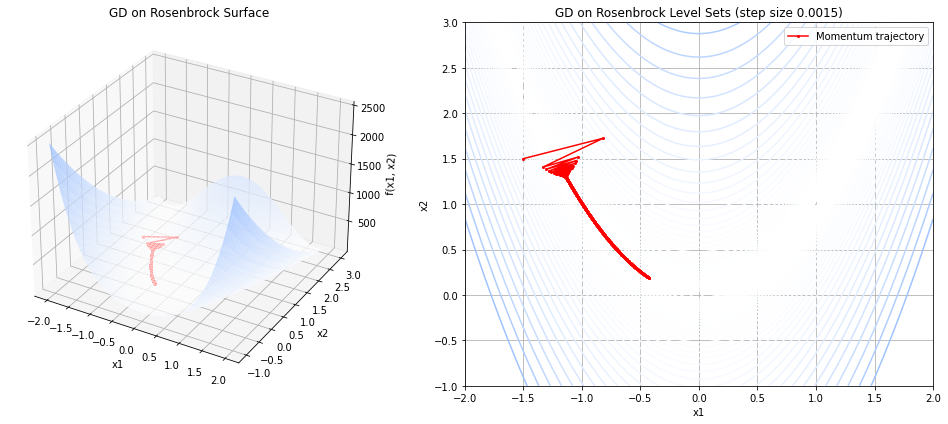

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Rosenbrock function and gradient
def rosenbrock(theta):
    x, y = theta
    return (1 - x)**2 + 100 * (y - x**2)**2

def rosenbrock_grad(theta):
    x, y = theta
    dx = -2 * (1 - x) - 400 * x * (y - x**2)
    dy = 200 * (y - x**2)
    return np.array([dx, dy])

# gradient descent
def gd(grad_fn, init_theta, lr=0.0015, steps=500):
    theta = np.array(init_theta, dtype=float)
    trajectory = [theta.copy()]
    
    for _ in range(steps):
        grad = grad_fn(theta)
        theta -= lr * grad
        trajectory.append(theta.copy())
    
    return np.array(trajectory)

# Compute trajectory
lr = 0.0015
trajectory = gd(rosenbrock_grad, init_theta=[-1.5, 1.5],lr=lr)

# Prepare grid
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = (1 - X)**2 + 100 * (Y - X**2)**2

# Compute Z values along trajectory
Z_traj = np.array([rosenbrock(p) for p in trajectory])

# Plotting
fig = plt.figure(figsize=(14, 6))

# 3D surface with trajectory
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(X, Y, Z, cmap=cm_0, alpha=0.8, edgecolor='none')
ax1.plot(trajectory[:, 0], trajectory[:, 1], Z_traj, color='red', marker='o', markersize=2, label='Momentum trajectory')
ax1.set_title("GD on Rosenbrock Surface")
ax1.set_xlabel("x1"); ax1.set_ylabel("x2"); ax1.set_zlabel("f(x1, x2)")

# Contour plot (level sets)
ax2 = fig.add_subplot(1, 2, 2)
ax2.contour(X, Y, Z, levels=np.logspace(-1, 3, 50), cmap=cm_0)
ax2.plot(trajectory[:, 0], trajectory[:, 1], marker='o', markersize=2, color='red', label='Momentum trajectory')
ax2.set_title(f"GD on Rosenbrock Level Sets (step size {lr})")
ax2.set_xlabel("x1"); ax2.set_ylabel("x2")
ax2.grid(True); ax2.legend()

plt.tight_layout()
plt.show()


We increase now the step-size to $\eta=0.0035$. We see how in the beginning, the method makes big steps, which get smaller when the iterates land near the valley, but the zig-zagging is still strong and we don't make good progress to the minimizer. For the Rosenbrock function, we need a lot of steps to converge to the minimizer, while the analytic method to compute the stationary points directly gives us the optimum.  The problem with the Rosenbrock function is that gradient descent

- **oscillates** in directions with steep gradients (anything that is not in the U-shaped valley of the Rosenbrock function)
- **converges slowly** in directions with small gradients (when the iterates are in the valley)

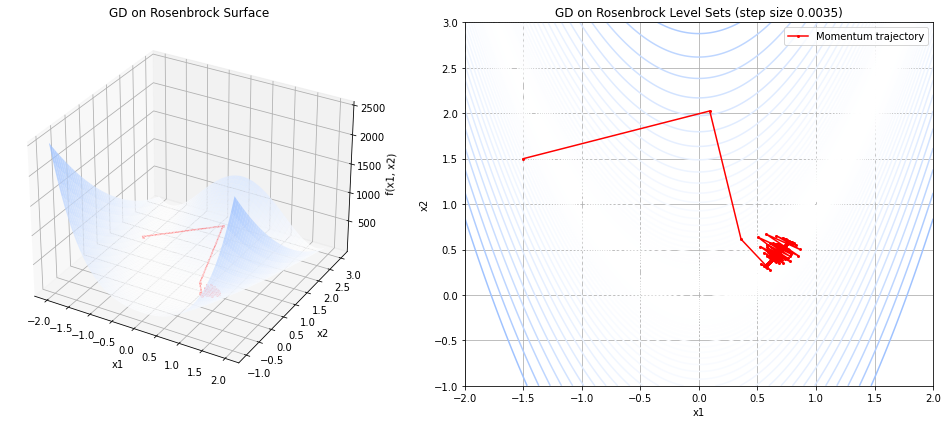

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

lr = 0.0035
# Compute trajectory
trajectory = gd(rosenbrock_grad, init_theta=[-1.5, 1.5],lr=lr)

# Prepare grid
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = (1 - X)**2 + 100 * (Y - X**2)**2

# Compute Z values along trajectory
Z_traj = np.array([rosenbrock(p) for p in trajectory])

# Plotting
fig = plt.figure(figsize=(14, 6))

# 3D surface with trajectory
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(X, Y, Z, cmap=cm_0, alpha=0.8, edgecolor='none')
ax1.plot(trajectory[:, 0], trajectory[:, 1], Z_traj, color='red', marker='o', markersize=2, label='Momentum trajectory')
ax1.set_title("GD on Rosenbrock Surface")
ax1.set_xlabel("x1"); ax1.set_ylabel("x2"); ax1.set_zlabel("f(x1, x2)")

# Contour plot (level sets)
ax2 = fig.add_subplot(1, 2, 2)
ax2.contour(X, Y, Z, levels=np.logspace(-1, 3, 50), cmap=cm_0)
ax2.plot(trajectory[:, 0], trajectory[:, 1], marker='o', markersize=2, color='red', label='Momentum trajectory')
ax2.set_title(f"GD on Rosenbrock Level Sets (step size {lr})")
ax2.set_xlabel("x1"); ax2.set_ylabel("x2")
ax2.grid(True); ax2.legend()

plt.tight_layout()
plt.show()


In practice, encountering a convergence behaviour as from the Rosenbrock functions is problematic, since we apply numerical optimization if we can't compute the optimum analytically. If we don't know where the optimum is, we might give up after the 500 steps where not much is happening, because the function has not been decreasing by much.
### Gradient Descent with Momentum

We have seen how gradient descent can be slow and inefficient, especially in loss landscapes with narrow canyons, such as in the Rosenbrock function. The idea of momentum is to accelerate learning by accumulating past gradients, building up speed in consistent directions and dampening oscillations. 

A common analogy used to explain the idea of momentum is to imagine rolling a ball down a hilly landscape. Without momentum it stops at every bump, because we only behave according to the gradient, that adjusts locally. With momentum it builds speed in downhill directions and glides over small bumps.

Technically, momentum introduces only a small change. Instead of the gradient, we subtract now the velocity vector $\vvec{v}_t$, a moving average of past gradients.

```{prf:algorithm} Gradient Descent with Momentum
**Input**: the function $f$ to minimize, step-size $\eta$, momentum coefficient $\gamma$ 
1. $\vvec{x}_0\gets$ `Initialize`($\vvec{x}_0$)  
2. $\vvec{v_0}\gets \vvec{0}$
2. **for** $t\in\{1,\ldots,t_{max}-1\}$
    1. $\vvec{v}_t = \gamma \vvec{v}_{t-1} + \eta \nabla_\theta f(\vvec{x}_t) $
    2. $\vvec{x}_{t+1} \leftarrow \vvec{x}_t - \mathbf{v}_t$
3. **return** $\vvec{x}_{t_{max}}$
```
Gradient descent with momentum is generally much faster than vanilla gradient descent. Setting the parameter $\gamma $ in practice is not very challenging since $\gamma\in\{0.9,0.99\}$ works usually well. If you are interested in a deeper dive into why momentum works, I recommend looking at this [paper](https://distill.pub/2017/momentum/).


#### Example: Rosenbrock Function
We plot below the trajectory of the gradient descent method with momentum, using a step-size of $\eta = 0.0015$ and a value of $\gamma=0.9$. We use 500 iteration steps, where we see that those are now sufficient to converge to the minimizer $(1,1)$.

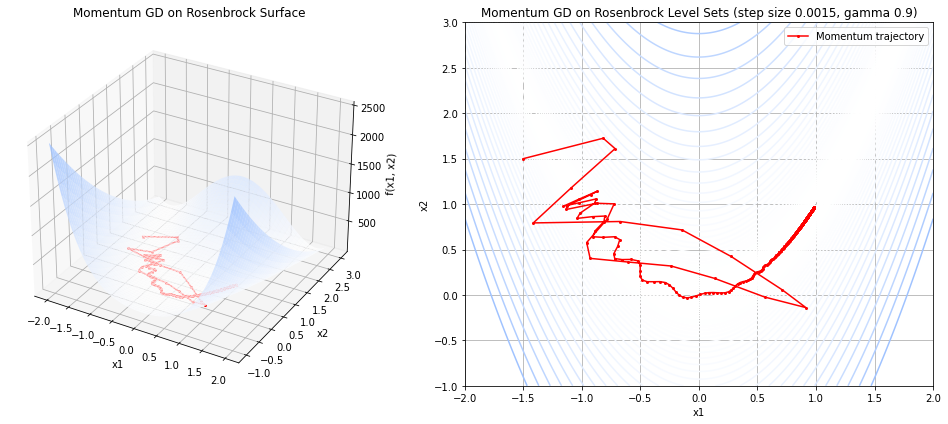

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Rosenbrock function and gradient
def rosenbrock(theta):
    x, y = theta
    return (1 - x)**2 + 100 * (y - x**2)**2

def rosenbrock_grad(theta):
    x, y = theta
    dx = -2 * (1 - x) - 400 * x * (y - x**2)
    dy = 200 * (y - x**2)
    return np.array([dx, dy])

# Momentum gradient descent
def momentum_gd(grad_fn, init_theta, lr=0.0015, gamma=0.9, steps=500):
    theta = np.array(init_theta, dtype=float)
    v = np.zeros_like(theta)
    trajectory = [theta.copy()]
    
    for _ in range(steps):
        grad = grad_fn(theta)
        v = gamma * v + lr * grad
        theta -= v
        trajectory.append(theta.copy())
    
    return np.array(trajectory)

# Compute trajectory
lr = 0.0015
gamma =0.9
trajectory = momentum_gd(rosenbrock_grad, init_theta=[-1.5, 1.5],lr =lr, gamma=gamma)

# Prepare grid
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = (1 - X)**2 + 100 * (Y - X**2)**2

# Compute Z values along trajectory
Z_traj = np.array([rosenbrock(p) for p in trajectory])

# Plotting
fig = plt.figure(figsize=(14, 6))

# 3D surface with trajectory
ax1 = fig.add_subplot(1, 2, 1, projection='3d')
ax1.plot_surface(X, Y, Z, cmap=cm_0, alpha=0.8, edgecolor='none')
ax1.plot(trajectory[:, 0], trajectory[:, 1], Z_traj, color='red', marker='o', markersize=2, label='Momentum trajectory')
ax1.set_title("Momentum GD on Rosenbrock Surface")
ax1.set_xlabel("x1"); ax1.set_ylabel("x2"); ax1.set_zlabel("f(x1, x2)")

# Contour plot (level sets)
ax2 = fig.add_subplot(1, 2, 2)
ax2.contour(X, Y, Z, levels=np.logspace(-1, 3, 50), cmap=cm_0)
ax2.plot(trajectory[:, 0], trajectory[:, 1], marker='o', markersize=2, color='red', label='Momentum trajectory')
ax2.set_title(f"Momentum GD on Rosenbrock Level Sets (step size {lr}, gamma {gamma})")
ax2.set_xlabel("x1"); ax2.set_ylabel("x2")
ax2.grid(True); ax2.legend()

plt.tight_layout()
plt.show()
